<a href="https://colab.research.google.com/github/matthew-mcateer/Keras_pruning/blob/master/Model_pruning_exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Keras Model pruning Exploration

Optimizing machine learning programs can take very different forms. Fortunately, neural networks have proven resilient to different transformations aimed at this goal.
One such family of optimizations aims to reduce the number of parameters and operations involved in the computation by removing connections, and thus parameters, in between neural network layers.

![Pruning example](https://miro.medium.com/max/1400/0*iNI8Oc80Eunm8NgI)

Weight pruning means eliminating unnecessary values in the weight tensors. We are practically setting the neural network parameters’ values to zero to remove what we estimate are unnecessary connections between the layers of a neural network. This is done during the training process to allow the neural network to adapt to the changes.



Networks generally look like the one on the left: every neuron in the layer below has a connection to the layer above; but this means that we have to multiply a lot of floats together. Ideally, we’d only connect each neuron to a few others and save on doing some of the multiplications; this is called a “sparse” network.

Given a layer of a neural network $ReLU(xW)$ are two well-known ways to prune it:
- **Weight pruning:** set individual weights in the weight matrix to zero. This corresponds to deleting connections as in the figure above.
    - Here, to achieve sparsity of $k%$ we rank the individual weights in weight matrix $W$ according to their magnitude (absolute value) $|wi,j|$, and then set to zero the smallest $k%$.
- **Unit/Neuron pruning:** set entire columns to zero in the weight matrix to zero, in effect deleting the corresponding output neuron.
    - Here to achieve sparsity of $k%$ we rank the columns of a weight matrix according to their L2-norm $|w| = \sqrt{\sum_{i=1}^{N}(x_i)^2}$ and delete the smallest $k%$.

Naturally, as you increase the sparsity and delete more of the network, the task performance will progressively degrade. What do you anticipate the degradation curve of sparsity vs. performance to be? Your assignment will be to plot this curve for **both weight and unit pruning**. Compare the curves and make some observations and hypotheses about the observations.


# Dependency Installations

In [1]:
! pip uninstall -y tensorflow
! pip uninstall -y tf-nightly
! pip install -U tf-nightly-gpu
! pip install tensorflow-model-optimization

import math
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.axes as axes
import numpy as np
import os
import pandas as pd
import seaborn as sns
import tempfile
import tensorboard
import tensorflow as tf
import timeit
import zipfile

from IPython.core.pylabtools import figsize
from numpy import linalg as LA
from tensorflow_model_optimization.sparsity import keras as sparsity

tf.enable_eager_execution()
plt.style.use('fivethirtyeight')
sns.set_context('notebook')
pd.set_option('display.max_rows', 30)
%config InlineBackend.figure_format = 'retina'
%load_ext tensorboard

Uninstalling tensorflow-1.14.0:
  Successfully uninstalled tensorflow-1.14.0
     |████████████████████████████████| 400.2MB 46kB/s 
     |████████████████████████████████| 3.9MB 40.0MB/s 
     |████████████████████████████████| 501kB 50.8MB/s 
     |████████████████████████████████| 61kB 31.0MB/s 
  Stored in directory: /root/.cache/pip/wheels/51/3e/a3/b351fae0cbf15373c2136a54a70f43fea5fe91d8168a5faaa4
Successfully built opt-einsum
     |████████████████████████████████| 71kB 4.8MB/s 


W0718 22:34:42.917115 140019772495744 module_wrapper.py:136] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/util/module_wrapper.py:163: The name tf.enable_eager_execution is deprecated. Please use tf.compat.v1.enable_eager_execution instead.



# Dataset

In [2]:
def load_dataset(dataset='mnist'):
    """
    Loads and preprocesses the data for this task.
    Args:
      dataset: the name of the dataset to be used for this classification task.
        (mnist | fmnist)
    Returns:
      x_train: Features for training data 
      x_test: Features for test data
      y_train: Labels for training data
      y_test: Labels for test data
      num_classes: Number of classes for the dataset
    """
    # input image dimensions (equal for both MNIST and FMNIST)
    img_rows, img_cols = 28, 28
    
    if dataset=='mnist':
        # Number of classes in the data
        num_classes = 10
        
        # the data, shuffled and split between train and test sets
        (x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()
    
    elif dataset=='fmnist':
        # Number of classes in the data
        num_classes = 10
        
        # the data, shuffled and split between train and test sets
        (x_train, y_train), (x_test, y_test) = tf.keras.datasets.fashion_mnist.load_data()
        
    else:
        print('dataset name does not match available options \n( mnist | keras )')

    x_train = x_train.reshape(x_train.shape[0], img_rows*img_cols)
    x_test = x_test.reshape(x_test.shape[0], img_rows*img_cols)
    input_shape = (img_rows*img_cols*1,)

    x_train = x_train.astype('float32')
    x_test = x_test.astype('float32')
    x_train /= 255
    x_test /= 255
    print('x_train shape:', x_train.shape)
    print(x_train.shape[0], 'train samples')
    print(x_test.shape[0], 'test samples')

    # convert class vectors to binary class matrices
    y_train = tf.keras.utils.to_categorical(y_train, num_classes)
    y_test = tf.keras.utils.to_categorical(y_test, num_classes)

    return x_train, x_test, y_train, y_test, num_classes, input_shape

# We will load separate tensors for the MNIST and FMNIST data. 

mnist_x_train, mnist_x_test, mnist_y_train, mnist_y_test, num_classes, input_shape = load_dataset(dataset='mnist')

fmnist_x_train, fmnist_x_test, fmnist_y_train, fmnist_y_test, num_classes, input_shape = load_dataset(dataset='fmnist')


11493376/11490434 [==============================] - 0s 0us/step
x_train shape: (60000, 784)
60000 train samples
10000 test samples
4423680/4422102 [==============================] - 0s 0us/step
x_train shape: (60000, 784)
60000 train samples
10000 test samples


## Training a keras model without pruning

We will construct a $ReLU$-activated neural network with four hidden layers. These layers will be dense, fully-connected layers with sizes $1000$, $1000$, $500$, & $200$.We'll also have have a fifth layer for the output logits, which we will have 10 (**Note:** Since these connect directly to the output layer, these will be spared from any and all pruning).

For the sake of simplicity, we will also omit Dropout layers, Convolutional layers, Batch Normalization Layers, and Avg Pooling Layers.

In [0]:
l = tf.keras.layers

def build_model_arch(input_shape, num_classes, sparsity=0.0):
    """
    Builds the model architecture
    Args:
      input_shape: The tuple describing the input shape
    Returns:
      model: an un-compiled TF.Keras model with 4 hidden
        dense layers with shapes [1000, 1000, 500, 200]
      num_classes: how many classes the data labels belong to
      sparsity: For compressing already sparse models, how much sparsity was used
    """

    model = tf.keras.Sequential()

    model.add(l.Dense(int(1000-(1000*sparsity)), activation='relu',
                      input_shape=input_shape)),
    model.add(l.Dense(int(1000-(1000*sparsity)), activation='relu'))
    model.add(l.Dense(int(500-(500*sparsity)), activation='relu'))
    model.add(l.Dense(int(200-(200*sparsity)), activation='relu'))
    model.add(l.Dense(num_classes, activation='softmax'))

    return model


# The architectures are the same, but we are initializing 2 different sequential
# models. One is for MNIST, and one is for FMNIST

mnist_model_base = build_model_arch(input_shape, num_classes)
fmnist_model_base = build_model_arch(input_shape, num_classes)



Load [TensorBoard](https://www.tensorflow.org/tensorboard) to monitor the training process

In [4]:
logdir = tempfile.mkdtemp()
print('Writing training logs to ' + logdir)

Writing training logs to /tmp/tmp4ba2q4bm


## Training the model

In [5]:
def make_nosparse_model(model, x_train, y_train, batch_size, 
                         epochs, x_test, y_test):
    """
    Training a model with no sparsity
    Args:
      model: Uncompiled Keras model
      x_train: Features for training data 
      y_train: Labels for training data
      batch_size: Batch size for training
      epochs: Number of epochs for training
      x_test: Features for test data
      y_test: Labels for test data
    Returns:
      model: compiled model
      score: List of both final test loss and final test accuracy
    """
    callbacks = [tf.keras.callbacks.TensorBoard(log_dir=logdir, profile_batch=0)]

    model.compile(
        loss=tf.keras.losses.categorical_crossentropy,
        optimizer='adam',
        metrics=['accuracy'])

    model.fit(x_train, y_train,
              batch_size=batch_size,
              epochs=epochs,
              verbose=1,
              callbacks=callbacks,
              validation_data=(x_test, y_test))
    score = model.evaluate(x_test, y_test, verbose=0)
    print('Test loss:', score[0])
    print('Test accuracy:', score[1])
    
    return model, score

batch_size = 128
epochs = 10

mnist_model, mnist_score = make_nosparse_model(mnist_model_base,
                                               mnist_x_train,
                                               mnist_y_train,
                                               batch_size,
                                               epochs,
                                               mnist_x_test,
                                               mnist_y_test)

fmnist_model, fmnist_score = make_nosparse_model(fmnist_model_base,
                                                 fmnist_x_train,
                                                 fmnist_y_train,
                                                 batch_size,
                                                 epochs,
                                                 fmnist_x_test,
                                                 fmnist_y_test)

W0718 22:34:47.218426 140019772495744 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/ops/math_grad.py:1251: where (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
W0718 22:34:47.329293 140019772495744 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/keras/optimizer_v2/optimizer_v2.py:468: BaseResourceVariable.constraint (from tensorflow.python.ops.resource_variable_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Apply a constraint manually following the optimizer update step.


Train on 60000 samples, validate on 10000 samples
Epoch 1/10
60000/60000 [==============================] - 3s 44us/sample - loss: 0.2044 - acc: 0.9362 - val_loss: 0.0934 - val_acc: 0.9723
Epoch 2/10
60000/60000 [==============================] - 2s 28us/sample - loss: 0.0861 - acc: 0.9740 - val_loss: 0.1094 - val_acc: 0.9673
Epoch 3/10
60000/60000 [==============================] - 2s 27us/sample - loss: 0.0589 - acc: 0.9816 - val_loss: 0.0702 - val_acc: 0.9794
Epoch 4/10
60000/60000 [==============================] - 2s 27us/sample - loss: 0.0465 - acc: 0.9858 - val_loss: 0.0849 - val_acc: 0.9749
Epoch 5/10
60000/60000 [==============================] - 2s 28us/sample - loss: 0.0393 - acc: 0.9880 - val_loss: 0.0757 - val_acc: 0.9791
Epoch 6/10
60000/60000 [==============================] - 2s 27us/sample - loss: 0.0326 - acc: 0.9894 - val_loss: 0.0837 - val_acc: 0.9770
Epoch 7/10
60000/60000 [==============================] - 2s 27us/sample - loss: 0.0259 - acc: 0.9917 - val_loss: 0.

In [6]:
mnist_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1000)              785000    
_________________________________________________________________
dense_1 (Dense)              (None, 1000)              1001000   
_________________________________________________________________
dense_2 (Dense)              (None, 500)               500500    
_________________________________________________________________
dense_3 (Dense)              (None, 200)               100200    
_________________________________________________________________
dense_4 (Dense)              (None, 10)                2010      
Total params: 2,388,710
Trainable params: 2,388,710
Non-trainable params: 0
_________________________________________________________________


In [7]:
fmnist_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 1000)              785000    
_________________________________________________________________
dense_6 (Dense)              (None, 1000)              1001000   
_________________________________________________________________
dense_7 (Dense)              (None, 500)               500500    
_________________________________________________________________
dense_8 (Dense)              (None, 200)               100200    
_________________________________________________________________
dense_9 (Dense)              (None, 10)                2010      
Total params: 2,388,710
Trainable params: 2,388,710
Non-trainable params: 0
_________________________________________________________________


In [8]:
%tensorboard --logdir={logdir}

# Pruning

Now that the model is trained, we are going to prune away (set to zero) weigths of the trained model. Two pruning methods will be used for this:

- **Weight pruning:** set individual weights in the weight matrix to zero. This corresponds to deleting connections as in the figure above.
    - Here, to achieve sparsity of $k%$ we rank the individual weights in weight matrix $W$ according to their magnitude (absolute value) $|w_{i,j}|$, and then set to zero the smallest $k%$.
- **Unit/Neuron pruning:** set entire columns to zero in the weight matrix to zero, in effect deleting the corresponding output neuron.
    - Here to achieve sparsity of $k%$ we rank the columns of a weight matrix according to their L2-norm $|w| = \sqrt{\sum_{i=1}^{N}(x_i)^2}$ and delete the smallest $k%$.



The $k\%$ of weights using weight and unit pruning for $k$ in [$0, 25, 50, 60, 70, 80, 90, 95, 97, 99$]. Neither of these pruning methods will prune the weights leading to the softmax layer.

## Pruning the layers



In [0]:
def weight_prune_dense_layer(k_weights, b_weights, k_sparsity):

    # Copy the kernel weights and get ranked indeces of the abs
    kernel_weights = np.copy(k_weights)
    ind = np.unravel_index(
        np.argsort(
            np.abs(kernel_weights),
            axis=None),
        kernel_weights.shape)
        
    # Number of indexes to set to 0
    cutoff = int(len(ind[0])*k_sparsity)
    # The indexes in the 2D kernel weight matrix to set to 0
    sparse_cutoff_inds = (ind[0][0:cutoff], ind[1][0:cutoff])
    kernel_weights[sparse_cutoff_inds] = 0.
        
    # Copy the bias weights and get ranked indeces of the abs
    bias_weights = np.copy(b_weights)
    ind = np.unravel_index(
        np.argsort(
            np.abs(bias_weights), 
            axis=None), 
        bias_weights.shape)
        
    # Number of indexes to set to 0
    cutoff = int(len(ind[0])*k_sparsity)
    # The indexes in the 1D bias weight matrix to set to 0
    sparse_cutoff_inds = (ind[0][0:cutoff])
    bias_weights[sparse_cutoff_inds] = 0.
    
    return kernel_weights, bias_weights
    

In [0]:
def unit_prune_dense_layer(k_weights, b_weights, k_sparsity):
    """
    Takes in matrices of kernel and bias weights (for a dense
      layer) and returns the unit-pruned versions of each
    Args:
      k_weights: 2D matrix of the 
      b_weights: 1D matrix of the biases of a dense layer
      k_sparsity: percentage of weights to set to 0
    """

    # Copy the kernel weights and get ranked indeces of the
    # column-wise L2 Norms
    kernel_weights = np.copy(k_weights)
    ind = np.argsort(LA.norm(kernel_weights, axis=0))
        
    # Number of indexes to set to 0
    cutoff = int(len(ind)*k_sparsity)
    # The indexes in the 2D kernel weight matrix to set to 0
    sparse_cutoff_inds = ind[0:cutoff]
    kernel_weights[:,sparse_cutoff_inds] = 0.
        
    # Copy the bias weights and get ranked indeces of the abs
    bias_weights = np.copy(b_weights)
    ind = np.unravel_index(
        np.argsort(
            np.abs(bias_weights), 
            axis=None), 
        bias_weights.shape)
        
    # Number of indexes to set to 0
    cutoff = int(len(ind)*k_sparsity)
    # The indexes in the 1D bias weight matrix to set to 0
    sparse_cutoff_inds = ind[0:cutoff]
    bias_weights[sparse_cutoff_inds] = 0.
    
    return kernel_weights, bias_weights

## Pruning across an entire model

In [0]:
def sparsify_model(model, x_test, y_test, k_sparsity, pruning='weight'):
    """
    Takes in a model made of dense layers and prunes the weights
    Args:
      model: Keras model
      k_sparsity: target sparsity of the model
    Returns:
      sparse_model: sparsified copy of the previous model
    """
    # Copying a temporary sparse model from our original
    sparse_model = tf.keras.models.clone_model(model)
    sparse_model.set_weights(model.get_weights())
    
    # Getting a list of the names of each component (w + b) of each layer
    names = [weight.name for layer in sparse_model.layers for weight in layer.weights]
    # Getting the list of the weights for each component (w + b) of each layer
    weights = sparse_model.get_weights()
    
    # Initializing list that will contain the new sparse weights
    newWeightList = []

    # Iterate over all but the final 2 layers (the softmax)
    for i in range(0, len(weights)-2, 2):
        
        if pruning=='weight':
            kernel_weights, bias_weights = weight_prune_dense_layer(weights[i],
                                                                    weights[i+1],
                                                                    k_sparsity)
        elif pruning=='unit':
            kernel_weights, bias_weights = unit_prune_dense_layer(weights[i],
                                                                  weights[i+1],
                                                                  k_sparsity)
        else:
            print('does not match available pruning methods ( weight | unit )')
        
        # Append the new weight list with our sparsified kernel weights
        newWeightList.append(kernel_weights)
        
        # Append the new weight list with our sparsified bias weights
        newWeightList.append(bias_weights)

    # Adding the unchanged weights of the final 2 layers
    for i in range(len(weights)-2, len(weights)):
        unmodified_weight = np.copy(weights[i])
        newWeightList.append(unmodified_weight)

    # Setting the weights of our model to the new ones
    sparse_model.set_weights(newWeightList)
    
    # Re-compiling the Keras model (necessary for using `evaluate()`)
    sparse_model.compile(
        loss=tf.keras.losses.categorical_crossentropy,
        optimizer='adam',
        metrics=['accuracy'])
    
    # Printing the the associated loss & Accuracy for the k% sparsity
    score = sparse_model.evaluate(x_test, y_test, verbose=0)
    print('k% weight sparsity: ', k_sparsity,
          '\tTest loss: {}'.format(score[0]),
          '\tTest accuracy: {}'.format(score[1]))
    
    return sparse_model, score
 

## Weight-and-unit pruning across all $k\%$ sparsities

In [14]:
#@title Loop over each k% sparsity in the list

k_sparsities = [0.0, 0.25, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.97, 0.99]

mnist_model_loss_weight = []
mnist_model_accs_weight = []
mnist_model_loss_unit = []
mnist_model_accs_unit = []
fmnist_model_loss_weight = []
fmnist_model_accs_weight = []
fmnist_model_loss_unit = []
fmnist_model_accs_unit = []

dataset = 'mnist'
pruning = 'weight'
print('\n MNIST Weight-pruning\n')
for k_sparsity in k_sparsities:
    sparse_model, score = sparsify_model(mnist_model, 
                                         x_test=mnist_x_test,
                                         y_test=mnist_y_test, 
                                         k_sparsity=k_sparsity, 
                                         pruning=pruning)
    mnist_model_loss_weight.append(score[0])
    mnist_model_accs_weight.append(score[1])
    
    # Save entire model to an H5 file
    sparse_model.save('sparse_{}-model_k-{}_{}-pruned.h5'.format(dataset, k_sparsity, pruning))
    del sparse_model


pruning='unit'
print('\n MNIST Unit-pruning\n')
for k_sparsity in k_sparsities:
    sparse_model, score = sparsify_model(mnist_model,  
                                         x_test=mnist_x_test,
                                         y_test=mnist_y_test, 
                                         k_sparsity=k_sparsity, 
                                         pruning=pruning)
    mnist_model_loss_unit.append(score[0])
    mnist_model_accs_unit.append(score[1])
    
    # Save entire model to an H5 file
    sparse_model.save('sparse_{}-model_k-{}_{}-pruned.h5'.format(dataset, k_sparsity, pruning))
    del sparse_model

dataset = 'fmnist'
pruning = 'weight'
print('\n FMNIST Weight-pruning\n')
for k_sparsity in k_sparsities:
    sparse_model, score = sparsify_model(fmnist_model,  
                                         x_test=fmnist_x_test,
                                         y_test=fmnist_y_test,
                                         k_sparsity=k_sparsity, 
                                         pruning=pruning)
    fmnist_model_loss_weight.append(score[0])
    fmnist_model_accs_weight.append(score[1])
    
    # Save entire model to an H5 file
    sparse_model.save('sparse_{}-model_k-{}_{}-pruned.h5'.format(dataset, k_sparsity, pruning))
    del sparse_model


pruning='unit'
print('\n FMNIST Unit-pruning\n')
for k_sparsity in k_sparsities:
    sparse_model, score = sparsify_model(fmnist_model, 
                                         x_test=fmnist_x_test,
                                         y_test=fmnist_y_test, 
                                         k_sparsity=k_sparsity, 
                                         pruning=pruning)
    fmnist_model_loss_unit.append(score[0])
    fmnist_model_accs_unit.append(score[1])
    
    # Save entire model to an H5 file
    sparse_model.save('sparse_{}-model_k-{}_{}-pruned.h5'.format(dataset, k_sparsity, pruning))
    del sparse_model




 MNIST Weight-pruning

k% weight sparsity:  0.0 	Test loss: 0.0767117334284223 	Test accuracy: 0.982200026512146
k% weight sparsity:  0.25 	Test loss: 0.07622259401060874 	Test accuracy: 0.9821000099182129
k% weight sparsity:  0.5 	Test loss: 0.06965615182372276 	Test accuracy: 0.9812999963760376
k% weight sparsity:  0.6 	Test loss: 0.06709117956787813 	Test accuracy: 0.9801999926567078
k% weight sparsity:  0.7 	Test loss: 0.08036194263659417 	Test accuracy: 0.979200005531311
k% weight sparsity:  0.8 	Test loss: 0.20992754616737366 	Test accuracy: 0.9750999808311462
k% weight sparsity:  0.9 	Test loss: 1.257520125389099 	Test accuracy: 0.8748999834060669
k% weight sparsity:  0.95 	Test loss: 2.097008932876587 	Test accuracy: 0.29580000042915344
k% weight sparsity:  0.97 	Test loss: 2.2634470443725587 	Test accuracy: 0.10570000112056732
k% weight sparsity:  0.99 	Test loss: 2.3039572860717774 	Test accuracy: 0.09740000218153

 MNIST Unit-pruning

k% weight sparsity:  0.0 	Test loss: 0.

In [112]:
.00000000000000000000000001

1e-26

In [16]:
k_sparsities = np.asarray(k_sparsities)
mnist_model_loss_weight = np.asarray(mnist_model_loss_weight)
mnist_model_accs_weight = np.asarray(mnist_model_accs_weight)
mnist_model_loss_unit = np.asarray(mnist_model_loss_unit)
mnist_model_accs_unit = np.asarray(mnist_model_accs_unit)
fmnist_model_loss_weight = np.asarray(fmnist_model_loss_weight)
fmnist_model_accs_weight = np.asarray(fmnist_model_accs_weight)
fmnist_model_loss_unit = np.asarray(fmnist_model_loss_unit)
fmnist_model_accs_unit = np.asarray(fmnist_model_accs_unit)

sparsity_data = np.stack([k_sparsities,
                          mnist_model_loss_weight,
                          mnist_model_accs_weight,
                          mnist_model_loss_unit,
                          mnist_model_accs_unit,
                          fmnist_model_loss_weight,
                          fmnist_model_accs_weight,
                          fmnist_model_loss_unit,
                          fmnist_model_accs_unit])

sparsity_summary = pd.DataFrame(data=sparsity_data.T,    # values
                                columns=['k_sparsity',   # Column names
                                         'mnist_loss_weight',
                                         'mnist_acc_weight',
                                         'mnist_loss_unit',
                                         'mnist_acc_unit',
                                         'fmnist_loss_weight',
                                         'fmnist_acc_weight',
                                         'fmnist_loss_unit',
                                         'fmnist_acc_unit'])
sparsity_summary

,k_sparsity,mnist_loss_weight,mnist_acc_weight,mnist_loss_unit,mnist_acc_unit,fmnist_loss_weight,fmnist_acc_weight,fmnist_loss_unit,fmnist_acc_unit
0,0.00,0.076712,0.9822,0.075591,0.9827,0.356505,0.8858,0.364259,0.8775
1,0.25,0.076223,0.9821,0.069718,0.9826,0.352801,0.8856,0.358988,0.8798
2,0.50,0.069656,0.9813,0.104250,0.9800,0.336986,0.8857,0.516622,0.8731
3,0.60,0.067091,0.9802,0.274698,0.9788,0.335422,0.8855,0.769476,0.7880
4,0.70,0.080362,0.9792,0.893988,0.9710,0.350157,0.8795,1.264302,0.7517
5,0.80,0.209928,0.9751,1.773150,0.8494,0.443989,0.8702,1.906835,0.5219
6,0.90,1.257520,0.8749,2.249736,0.1719,1.027957,0.7080,2.256891,0.1494
7,0.95,2.097009,0.2958,2.298856,0.0985,1.837693,0.4301,2.298383,0.1000
8,0.97,2.263447,0.1057,2.303470,0.0974,2.144189,0.2376,2.303697,0.1000
9,0.99,2.303957,0.0974,2.304797,0.0974,2.299447,0.1000,2.305279,0.1000


## Plotting

### Visualizing Sparsity

In [0]:
def visualize_model_weights(sparse_model):
    """
    Visualize the weights of the layers of the sparse model.
    For
    """
    weights = sparse_model.get_weights()
    names = [weight.name for layer in sparse_model.layers for weight in layer.weights]
    
    my_cmap = matplotlib.cm.get_cmap('rainbow')
    my_cmap.set_under('w')

    for i in range(len(weights)):
        weight_matrix = weights[i]
        layer_name = names[i]
        if weight_matrix.ndim == 1:
            weight_matrix = np.resize(weight_matrix,
                                      (1,weight_matrix.size))
            plt.imshow(np.abs(weight_matrix),
                       interpolation='none',
                       aspect = "auto",
                       cmap=my_cmap,
                       vmin=1e-26);
            plt.colorbar()
            plt.title(layer_name)
            plt.show()
        else:
            plt.imshow(np.abs(weight_matrix),
                       interpolation='none',
                       cmap=my_cmap,
                       vmin=1e-26);
            plt.colorbar()
            plt.title(layer_name)
            plt.show()
    


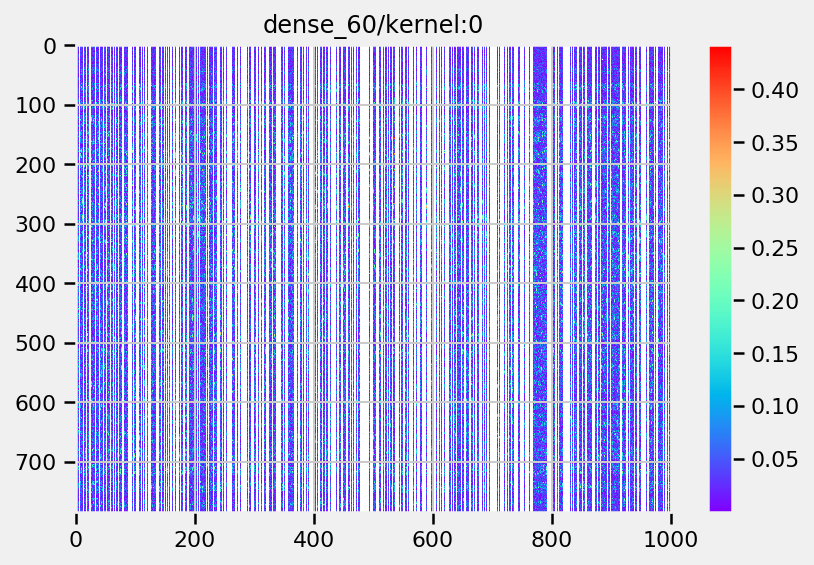

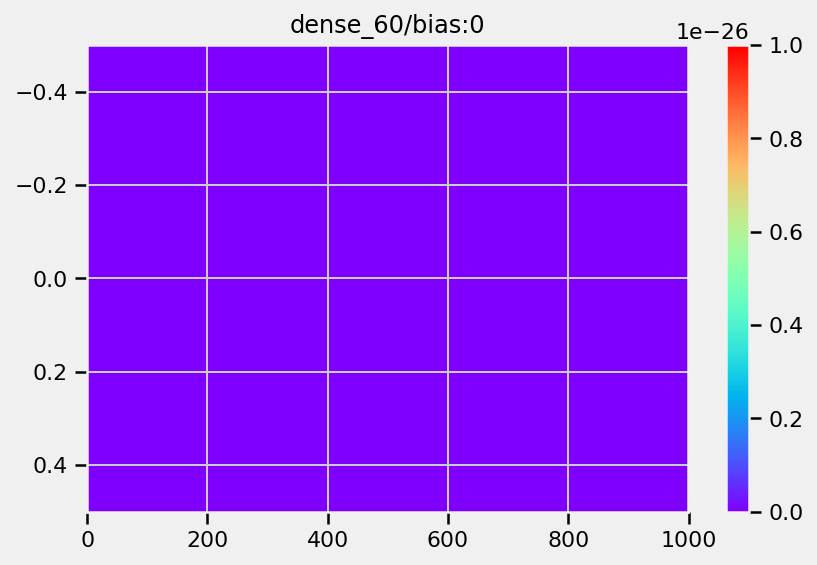

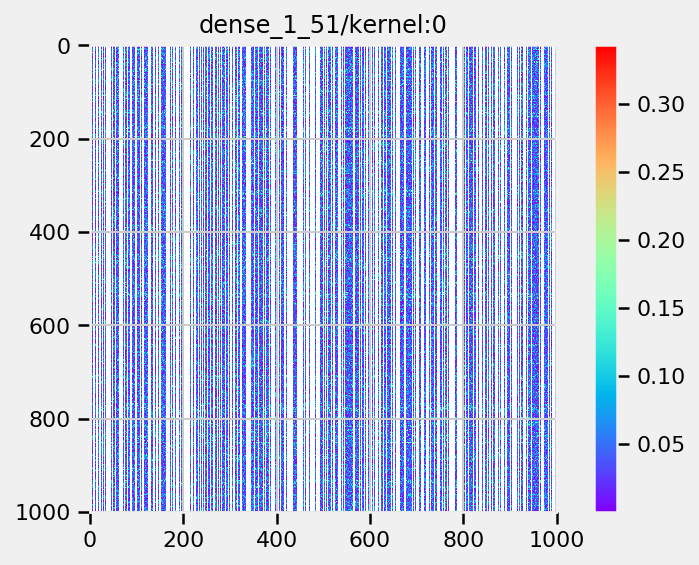

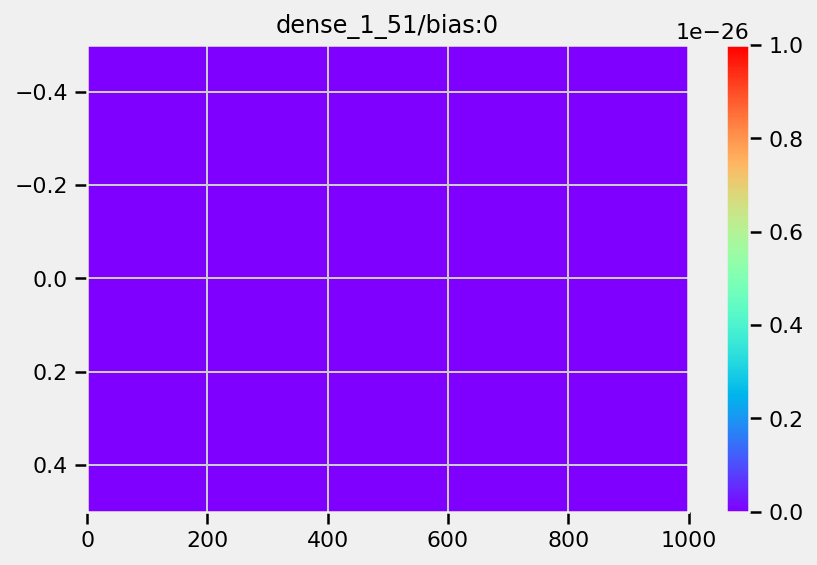

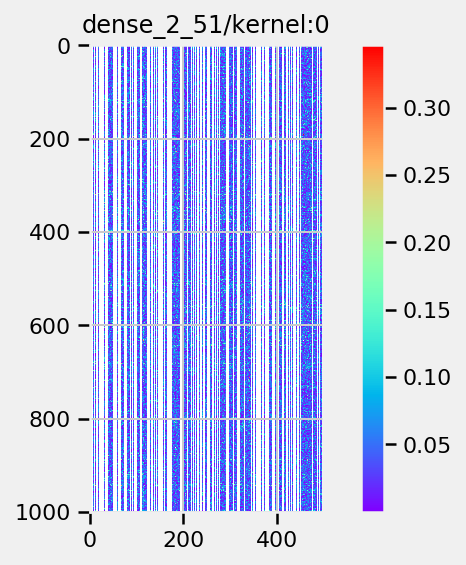

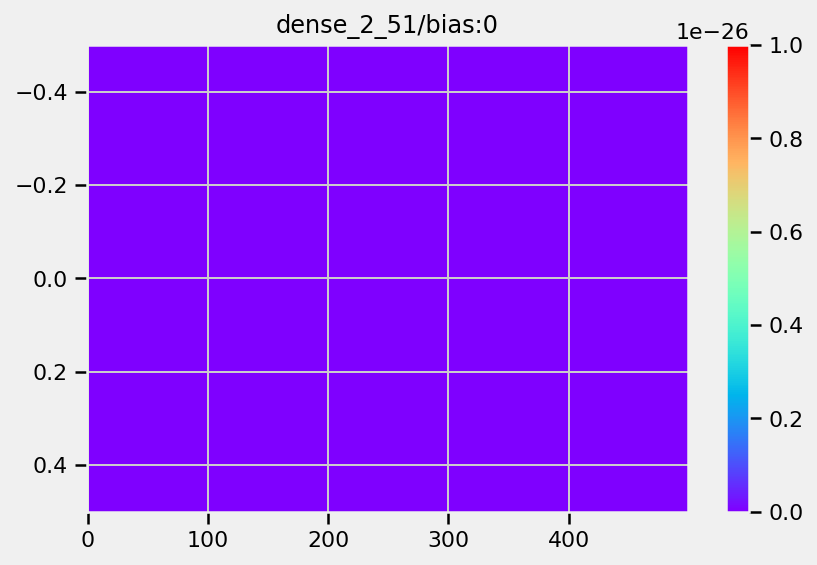

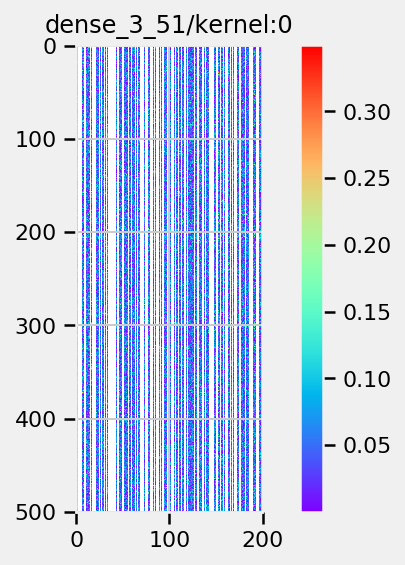

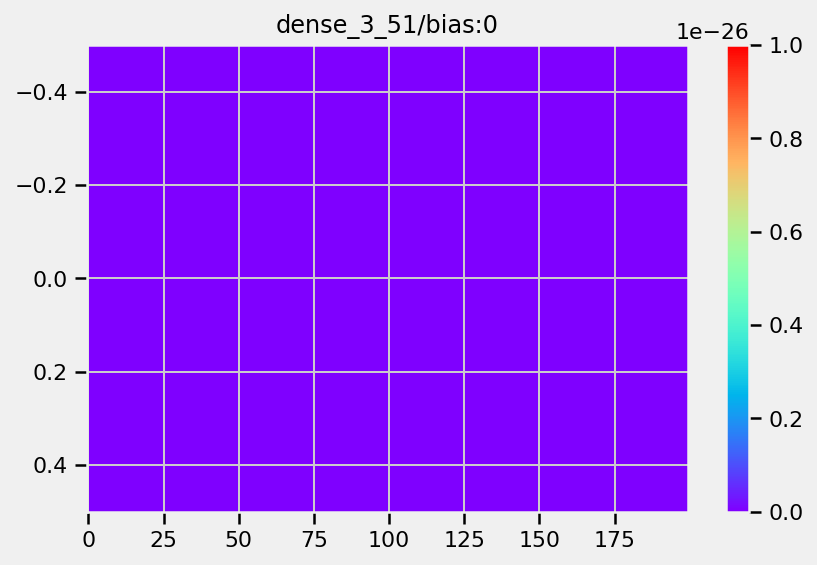

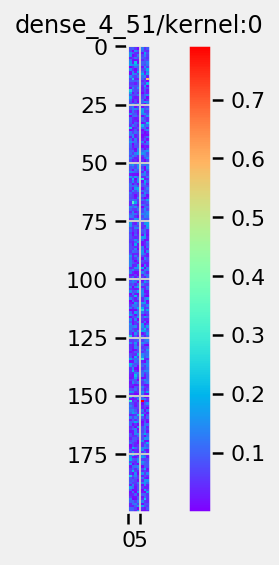

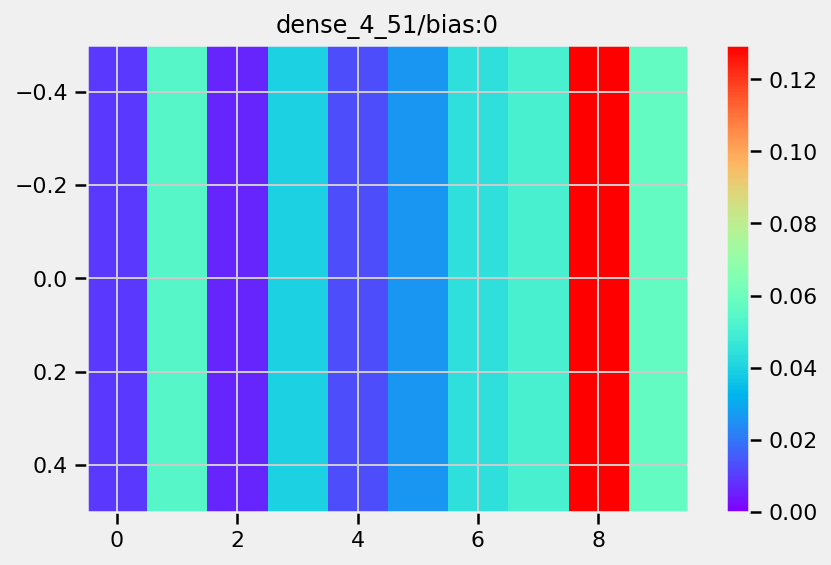

In [50]:
#@title Dense Layer visualization { run: "auto" }
from tensorflow.keras.models import load_model

#@markdown In Google Colab, this file becomes interactive, and you can select the sparse model you want to retrieve.
#@markdown 
#@markdown All weights with values of `0.0` will be color-coded weight. 1D Bias layers will be auto-scaled to the dimensions of the 2D plots.
#@markdown 
#@markdown Which dataset?
dataset = 'mnist' #@param ['mnist', 'fmnist']
#@markdown k sparsity
sparsity = "0.5" #@param ['0.0', '0.25', '0.5', '0.6', '0.7', '0.8', '0.9', '0.95', '0.97', '0.99']
#@markdown Pruning method.
pruning = 'unit' #@param ['unit', 'weight']

sparse_model = load_model('sparse_{}-model_k-{}_{}-pruned.h5'.format(dataset, sparsity, pruning))

visualize_model_weights(sparse_model)

### Visualizing sparse model performance on MNIST and FMNIST

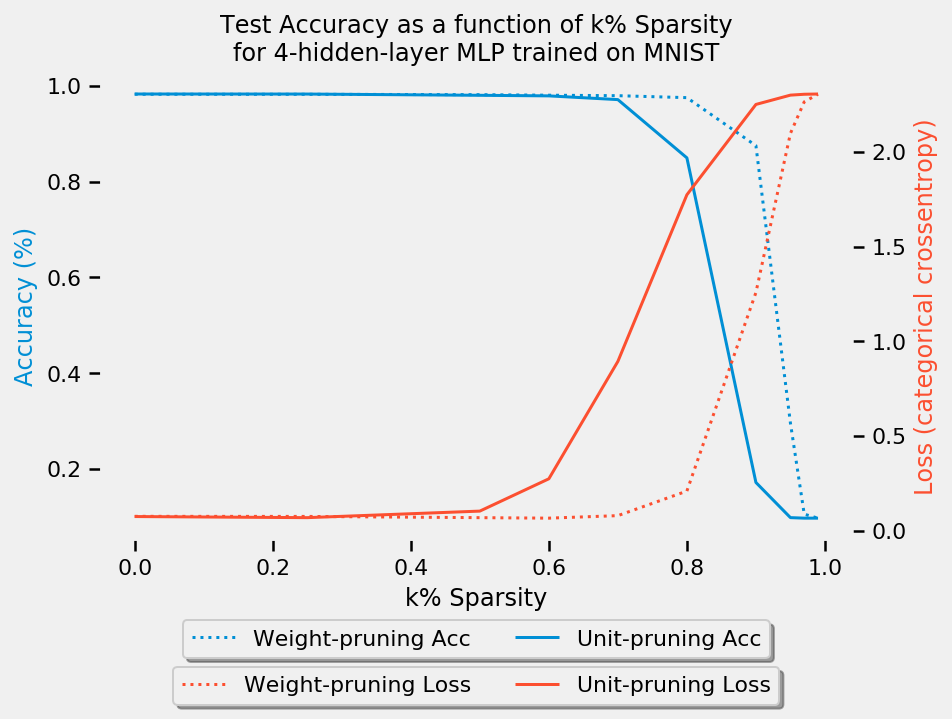

In [18]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
plt.grid(b=None)
ax2 = ax1.twinx()
plt.grid(b=None)
plt.title('Test Accuracy as a function of k% Sparsity\nfor 4-hidden-layer MLP trained on MNIST')
ax1.plot(sparsity_summary['k_sparsity'].values, sparsity_summary['mnist_acc_weight'].values, '#008fd5', linestyle=':', label='Weight-pruning Acc')
ax1.plot(sparsity_summary['k_sparsity'].values, sparsity_summary['mnist_acc_unit'].values, '#008fd5', linestyle='-', label='Unit-pruning Acc')
ax2.plot(sparsity_summary['k_sparsity'].values, sparsity_summary['mnist_loss_weight'].values, '#fc4f30', linestyle=':', label='Weight-pruning Loss')
ax2.plot(sparsity_summary['k_sparsity'].values, sparsity_summary['mnist_loss_unit'].values, '#fc4f30', linestyle='-', label='Unit-pruning Loss')

ax1.set_ylabel('Accuracy (%)', color='#008fd5')
ax2.set_ylabel('Loss (categorical crossentropy)', color='#fc4f30')
ax1.set_xlabel('k% Sparsity')
ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=2)
ax2.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), shadow=True, ncol=2)

The performance curves for unit and weight pruning differ on MNIST. 

Pruing weight matrices of dense matrices does not result in dramatic drops in accuracy or increases in loss until around $k=80$. Even then, the accuracy does not begin to noticeably decrease until $k=90$.

For unit-pruning, accuracy begins to fall earlier, around $k=70$ (with loss beginning to increase around $k=60$). Even then, both methods are able to effecively remove more than half of the network weights without any dramatic differences in test classification performance.

How does this work on FMNIST?

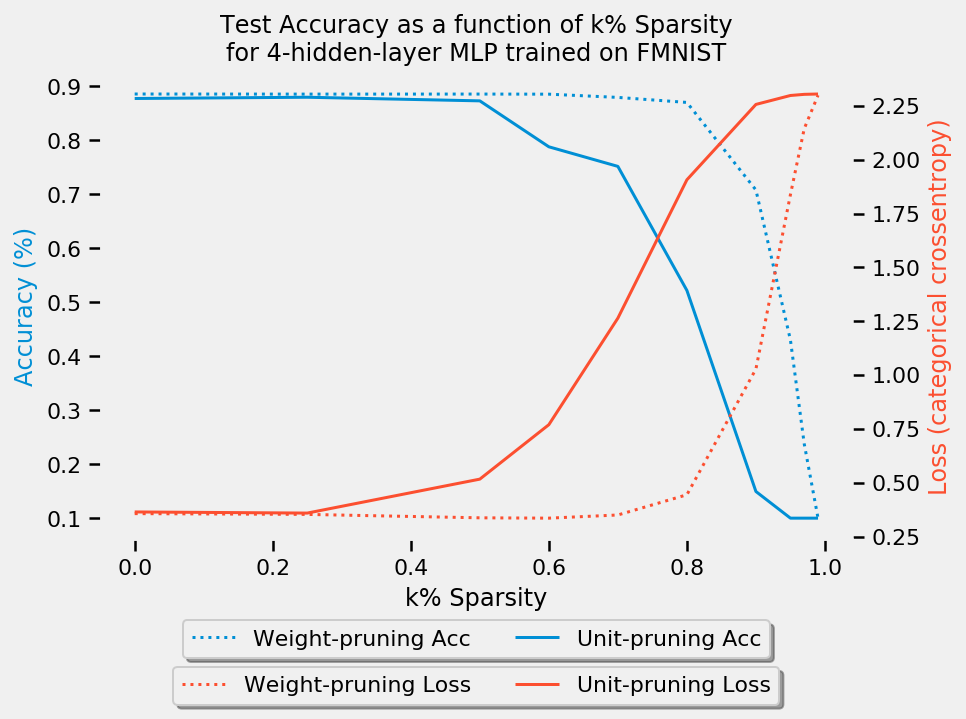

In [19]:
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)
plt.grid(b=None)
ax2 = ax1.twinx()
plt.grid(b=None)
plt.title('Test Accuracy as a function of k% Sparsity\nfor 4-hidden-layer MLP trained on FMNIST')
ax1.plot(sparsity_summary['k_sparsity'].values, sparsity_summary['fmnist_acc_weight'].values, '#008fd5', linestyle=':', label='Weight-pruning Acc')
ax1.plot(sparsity_summary['k_sparsity'].values, sparsity_summary['fmnist_acc_unit'].values, '#008fd5', linestyle='-', label='Unit-pruning Acc')
ax2.plot(sparsity_summary['k_sparsity'].values, sparsity_summary['fmnist_loss_weight'].values, '#fc4f30', linestyle=':', label='Weight-pruning Loss')
ax2.plot(sparsity_summary['k_sparsity'].values, sparsity_summary['fmnist_loss_unit'].values, '#fc4f30', linestyle='-', label='Unit-pruning Loss')

ax1.set_ylabel('Accuracy (%)', color='#008fd5')
ax2.set_ylabel('Loss (categorical crossentropy)', color='#fc4f30')
ax1.set_xlabel('k% Sparsity')
ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=2)
ax2.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), shadow=True, ncol=2)

Even on FMNIST, which had a lower initial accuracy and higher initial loss, the same pattern emerges

Again, pruing weight matrices of dense matrices does not result in dramatic drops in accuracy or increases in loss until around $k=80$. Even then, the accuracy does not begin to noticeably decrease until $k=90$.

For unit-pruning, the differences come much earlier for FMNIST than in MNIST. Accuracy begins to fall around $k=60$ (with loss beginning to increase around $k=60$).

#Step 7

**Why do you think that is/isn’t?**

The two methods use different strategies of finding the least useful weights. The weight-pruning finds the absolute values ($|w|$) of individual weights within the weight matrices. The unit-pruning finds L2 norms across entire columns of weight matrices. This difference is in part a difference between fine-grained and coarse-grained weight pruning.

**Do you have any hypotheses as to why we are able to delete so much of the network without hurting performance (this is an open research question)?**

This demonstration shows that neural network parameter counts of trained networks can be decreased by over $80\%$ without hurting perofrmance. Other researchers have demonstrated pruning techniques that can decrease parameter counts by over $90\%$. 

[[Frankle & Carbin, 2019]](https://arxiv.org/abs/1803.03635) proposed the "Lottery Ticket hypothesis". This hypthesis articulates that dense, randomly-initialized, feed-forward networks contain subnetworks ("winning tickets") that - when trained in isolation - reach test accuracy comparable to the original network in a similar number of iterations. It is named for the fact that these subnetworks, when initialized with random initialization, just happened to get initial weights that make training marticularly effective (i.e., they have won the "training lottery") For the task of MNIST, both weight-pruning and unit-pruning suggest that $2,388,710$ trainable parameters is supervluous compared to the truly optimal subnetwork that captures the concise classification function.

In finding ways of scaling the weights (or columns of weights), and removing the $k \%$ closest to $0$, we are trying to filter out all but the weights that make the input features maximally separable. [[Zhang et al., 2018]](https://arxiv.org/abs/1808.02229) compared the use of this kind of separation to Grassmannian Manifolds. Given that there is no universal formula to figuring out provably optimal subspace packings, the Grassmannian model of neural networks frames them as approximators of the solutions. Given that this is a less than optimal packing, some of the subspaces of the weights (e.g., those represented either as individual weights or vectors of weights) can easily be removed without impacting the performance of the classification. At some point, there are no more values to remove save for those satisfying the subspace packing needed for the maximum separability of the classes.

The latent variable model of neural network function would suggest that neural networks work by trying to learn the requisite latent variables ([David ha's blog post is a great example of this](http://blog.otoro.net/2016/04/01/generating-large-images-from-latent-vectors/)) needed to capture the epistemological essense of the given class. As David Ha's example shows, very high resolution images of MNIST digits can be produced from a generator with a vector containing just $32$ real numbers.

For finding minimum subnetwork (as framed by the "lottery-ticket hypothesis"), the optimal subspace packing (as framed by the ), it is also possible that there is more room for improvement beyond weight-pruning. Weight pruning looks at individual weight values in isolation. While the Unit pruning seems to suggest that looking at weights in combination does not produce better results, this is only one such filter for choosing weights to set to $0$. Uber AI tested out multiple masks for finding the "lottery-ticket" subnetworks.

![](https://1fykyq3mdn5r21tpna3wkdyi-wpengine.netdna-ssl.com/wp-content/uploads/2019/05/blog_header_2.png)
_Figure from Uber AI's ICML 2019 poster [Deconstructing Lottery Tickets: Zeros, Signs, and the Supermask](https://eng.uber.com/deconstructing-lottery-tickets/)_

It is also important to note that this pruning method only involves setting weight values below a certain threshold to $0$ and then testing immediately afterwards. The experiments shown in the code do not demonstrate successive rounds of successive weight pruning across multiple training rounds (like what [TF2.0's pruning API](https://www.tensorflow.org/model_optimization/guide/pruning/pruning_with_keras) allows for)

# Reducing model runtime with Sparsity
We will also test how much our models can be compressed using this new sparsity, and if this will speed up execution.



## Compressing model _without_ [TF model optimization toolkit](https://www.tensorflow.org/model_optimization)

In [0]:
def compress_sparse_weigths(sparse_model_weight_list, unique_columns=None):
    """
    Given a list of weight matrices of the layers, compreses all sparse matrices
    save for the last two layers
    Args:
      sparse_model_weight_list: List of weight matrices for 
    """
    compressed_weight_list = []
    
    for i in range(0,len(sparse_model_weight_list)-2,2):
        #print(i)
        
        if unique_columns==None:
            kernel_weights = sparse_model_weight_list[i]
        else:
            kernel_weights = sparse_model_weight_list[i][unique_columns,:]
        bias_weights = sparse_model_weight_list[i+1]
        
        
        indices = np.nonzero(kernel_weights) # a tuple of two arrays: 0th is row indices, 1st is cols
        columns_non_unique = indices[1]
        unique_columns = sorted(set(columns_non_unique))
        kernel_weights = kernel_weights[:,unique_columns]
        
        bias_weights = bias_weights[unique_columns]
        
        #print('Layer: {}'.format(i), ', Shape: ', kernel_weights.shape)
        #print('Layer: {}'.format(i+1), ', Shape: ', bias_weights.shape)
        compressed_weight_list.append(kernel_weights)
        compressed_weight_list.append(bias_weights)
        
    compressed_weight_list.append(sparse_model_weight_list[-2][unique_columns,:])
    compressed_weight_list.append(sparse_model_weight_list[-1])
    
    return compressed_weight_list

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_90 (Dense)             (None, 750)               588750    
_________________________________________________________________
dense_91 (Dense)             (None, 750)               563250    
_________________________________________________________________
dense_92 (Dense)             (None, 375)               281625    
_________________________________________________________________
dense_93 (Dense)             (None, 150)               56400     
_________________________________________________________________
dense_94 (Dense)             (None, 10)                1510      
Total params: 1,491,535
Trainable params: 1,491,535
Non-trainable params: 0
_________________________________________________________________
None

VISUALIZING ORIGINAL SPARSE MODEL


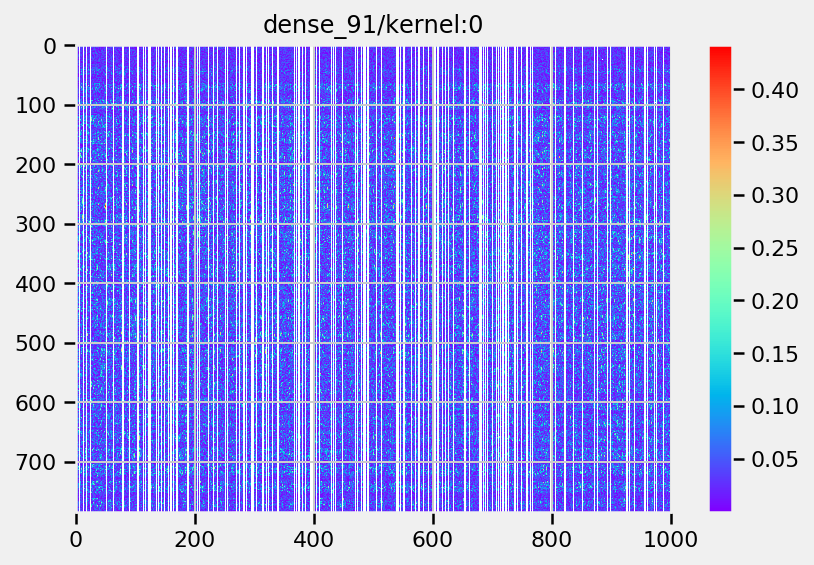

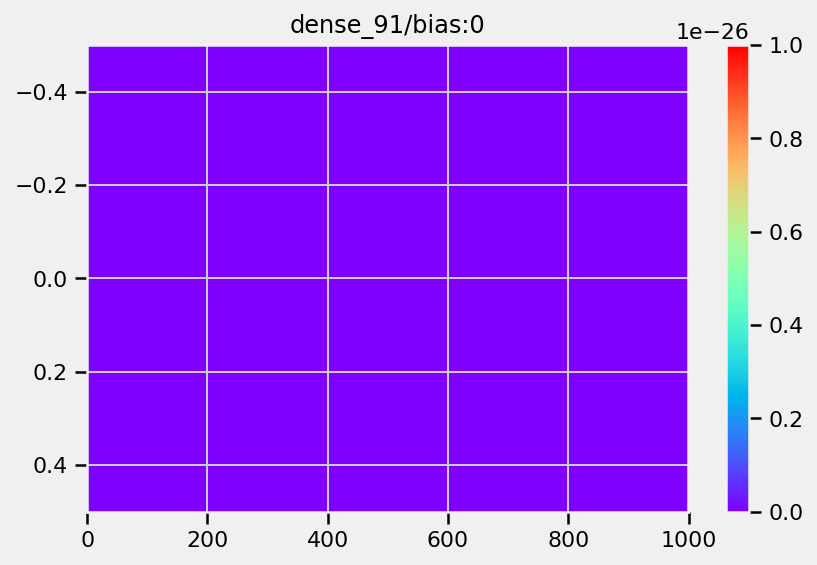

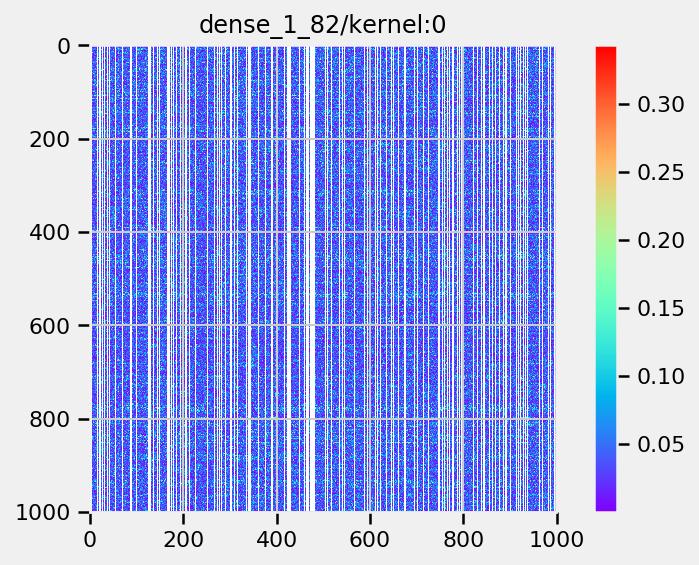

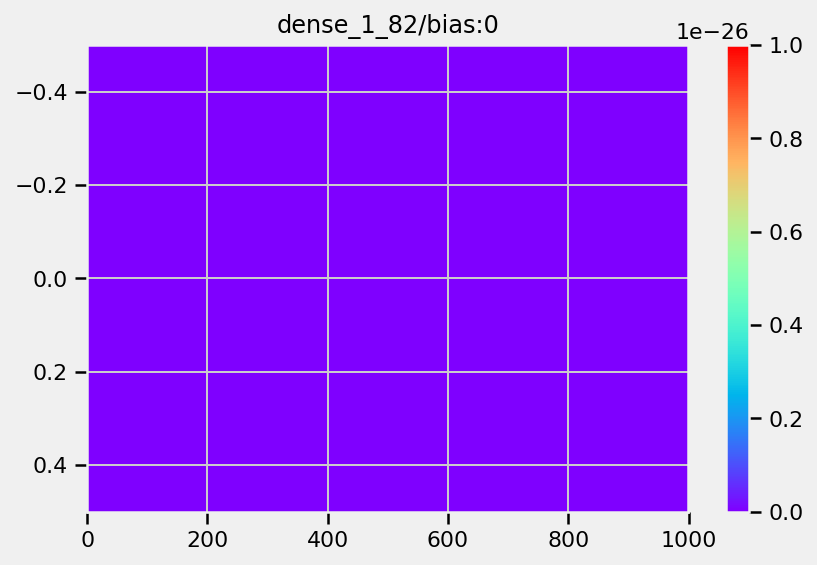

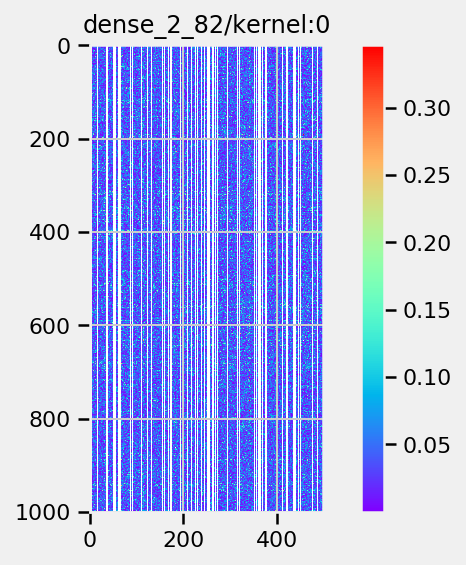

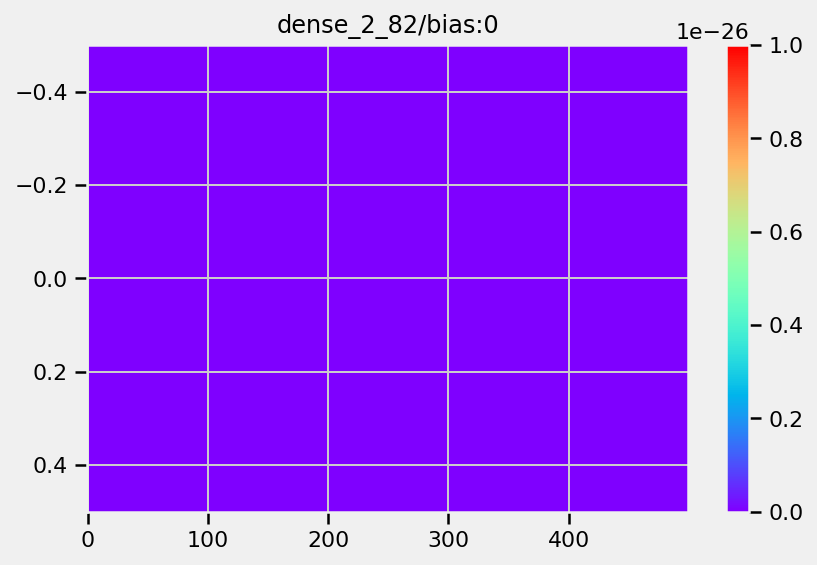

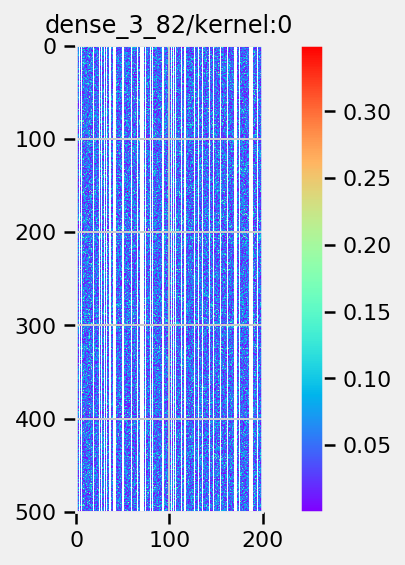

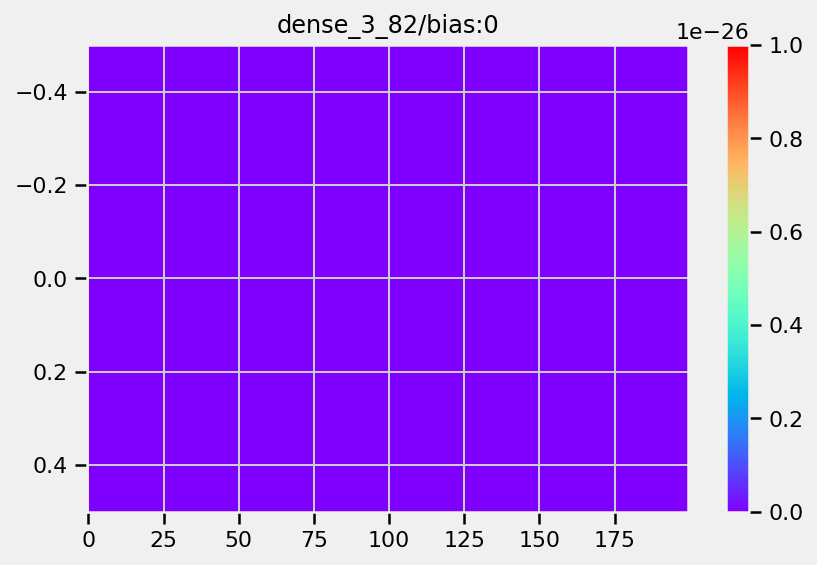

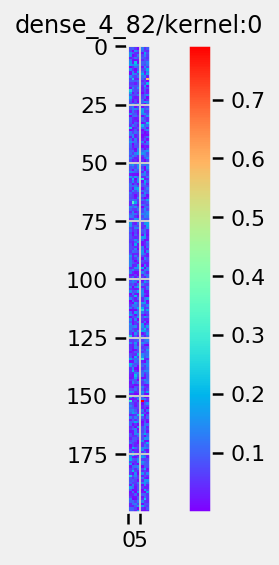

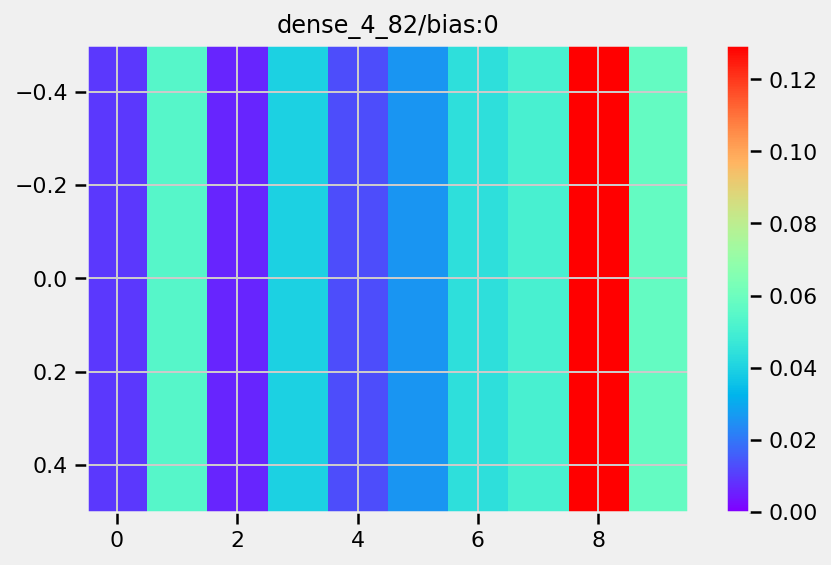


VISUALIZING COMPRESSED MODEL


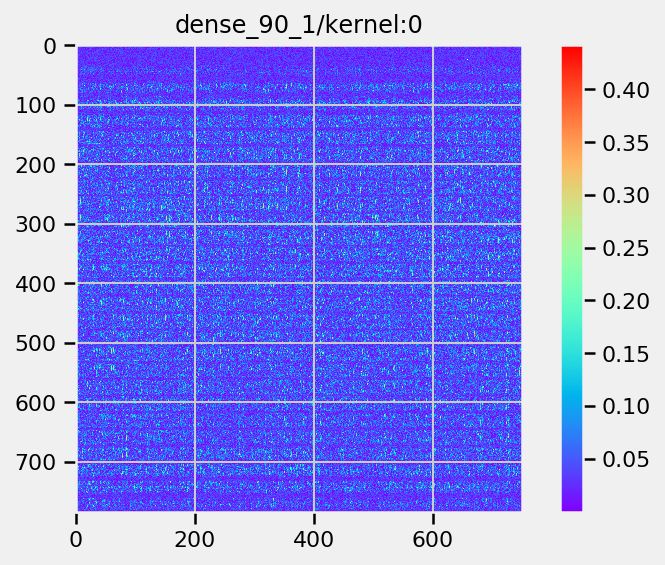

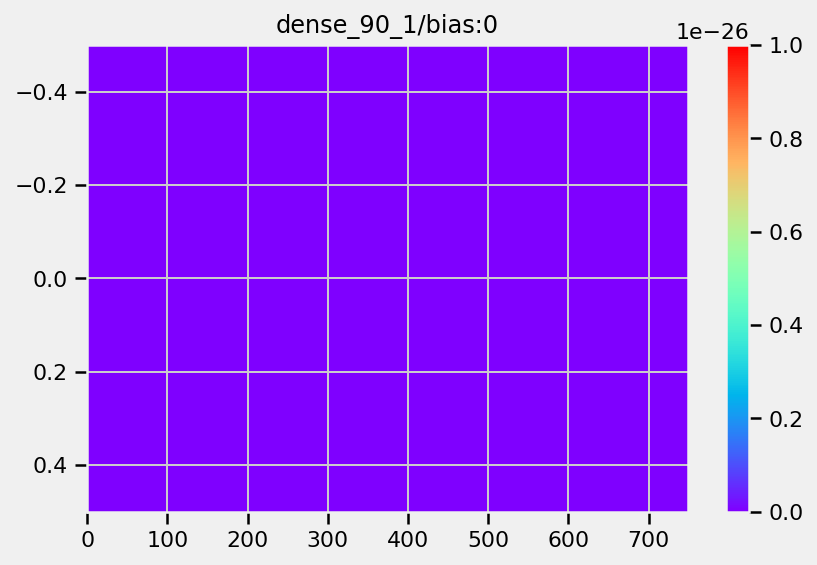

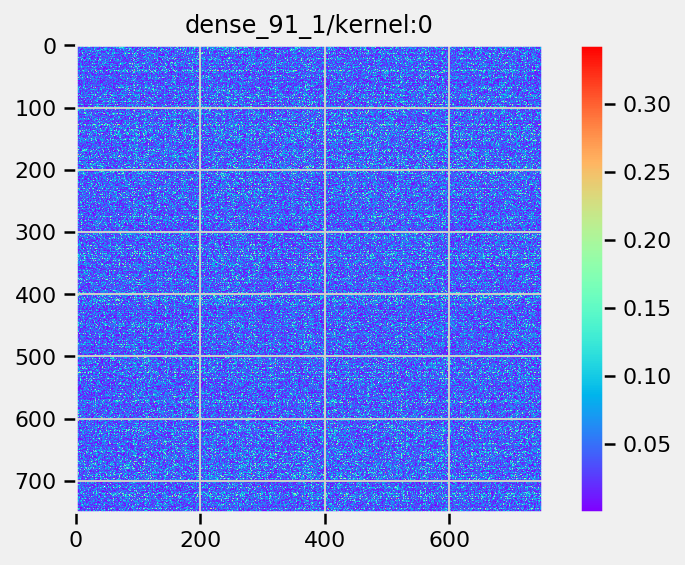

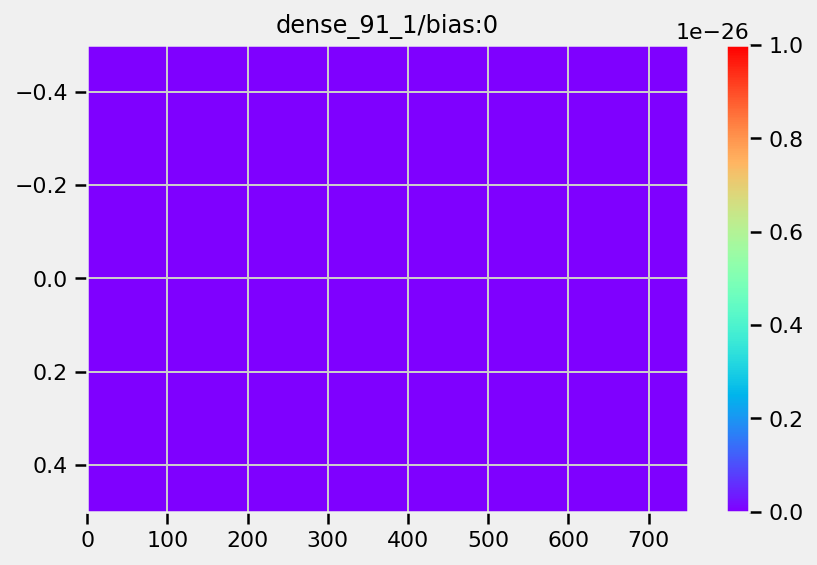

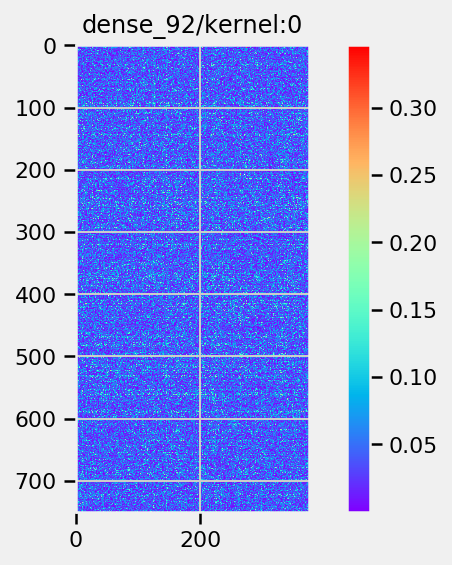

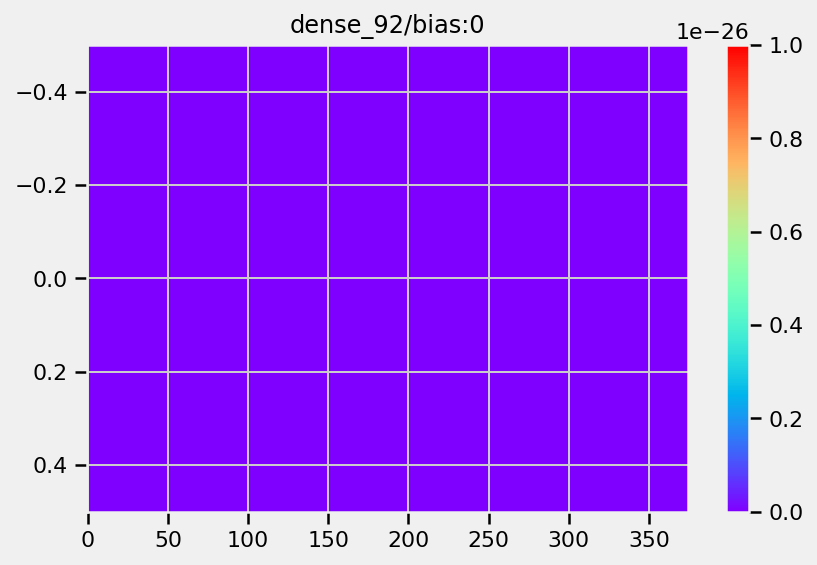

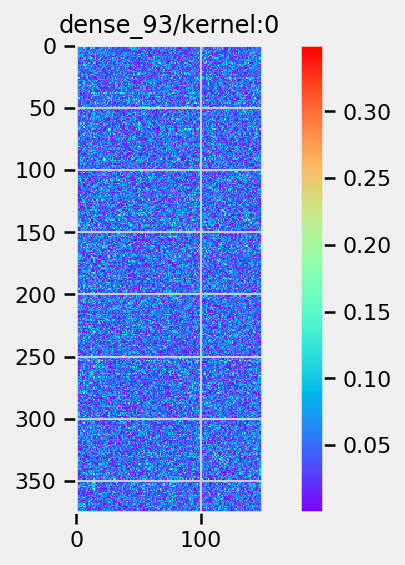

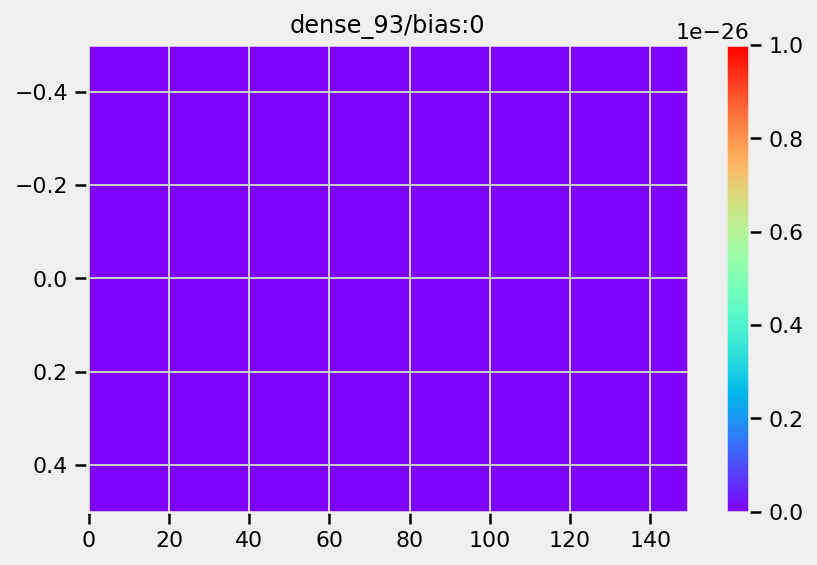

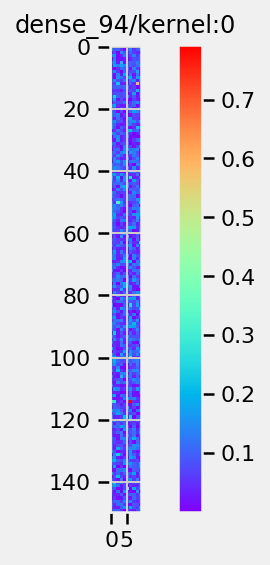

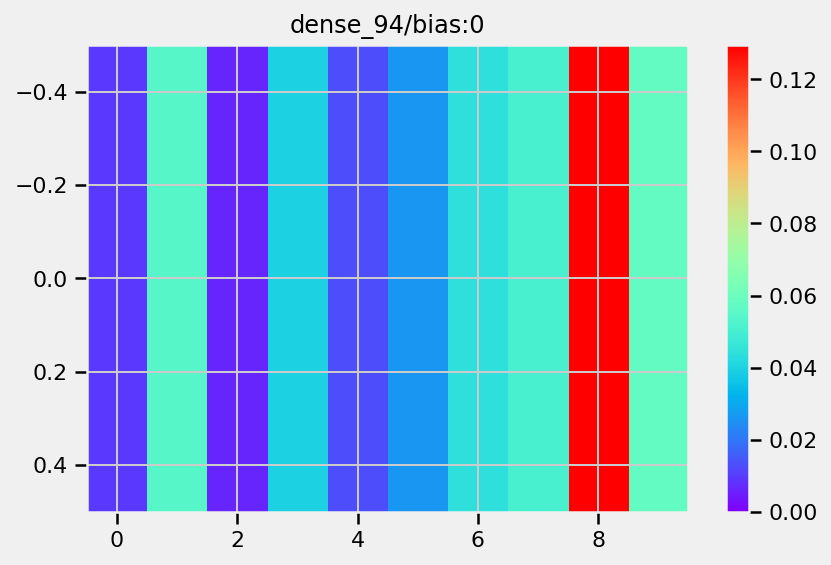

In [140]:
#@title Compressing sparse models (from saved files)

#@markdown Which dataset?
dataset = 'mnist' #@param ['mnist', 'fmnist']
#@markdown k sparsity
sparsity = "0.25" #@param ['0.0', '0.25', '0.5', '0.6', '0.7', '0.8', '0.9', '0.95', '0.97', '0.99']
#@markdown We are only using sparse models that have undrgone **unit** pruning
pruning = 'unit'
sparse_model = load_model('sparse_{}-model_k-{}_unit-pruned.h5'.format(dataset, sparsity, pruning))

sparse_weight_list = sparse_model.get_weights()
compressed_weight_list = compress_sparse_weigths(sparse_weight_list)

sparse_weight_list = sparse_model.get_weights()
compressed_weight_list = compress_sparse_weigths(sparse_weight_list)
compressed_model = build_model_arch(input_shape, num_classes, sparsity=float(sparsity))
compressed_model.compile(loss=tf.keras.losses.categorical_crossentropy,
                         optimizer='adam',
                         metrics=['accuracy'])
compressed_model.set_weights(compressed_weight_list)
print(compressed_model.summary())
print('\nVISUALIZING ORIGINAL SPARSE MODEL')
visualize_model_weights(sparse_model)
print('\nVISUALIZING COMPRESSED MODEL')
visualize_model_weights(compressed_model)

In [134]:
print('testing on {}'.format(dataset))
if dataset=='mnist':
    x_test = mnist_x_test
    y_test = mnist_y_test 
elif dataset=='fmnist':
    x_test = fmnist_x_test 
    y_test = fmnist_y_test
else:
    print('ERROR: Unrecognized dataset name')


testing on mnist


In [138]:
%time
old_score = sparse_model.evaluate(x_test, y_test, verbose=0)

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 7.15 µs


In [139]:
%time
new_score = compressed_model.evaluate(x_test, y_test, verbose=0)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 6.2 µs


In [137]:
print('k% weight sparsity (unit pruning): ', sparsity,
      '\nuncompressed',
      '\tTest loss: {}'.format(old_score[0]),
      '\tTest accuracy: {}'.format(old_score[1]),
      '\ncompressed',
      '\tTest loss: {}'.format(new_score[0]),
      '\tTest accuracy: {}'.format(new_score[1]))

k% weight sparsity (unit pruning):  0.25 
uncompressed 	Test loss: 0.06971841244636744 	Test accuracy: 0.9825999736785889 
compressed 	Test loss: 0.069718412191674 	Test accuracy: 0.9825999736785889


Not only does our compressed model get similar loss and accuracy as the non-compressed, but it also achieves the same result in less time.

# References

https://www.reddit.com/r/MachineLearning/comments/85eo8v/r_the_lottery_ticket_hypothesis_training_pruned/

https://jacobgil.github.io/deeplearning/pruning-deep-learning

https://docs.google.com/document/d/1cW-bP_7hw22Wi5nwWOcmMo7Pp9J04nwif8OiNqXRQ3o/edit

https://stackoverflow.com/questions/12957582/plot-yerr-xerr-as-shaded-region-rather-than-error-bars/12958534#12958534